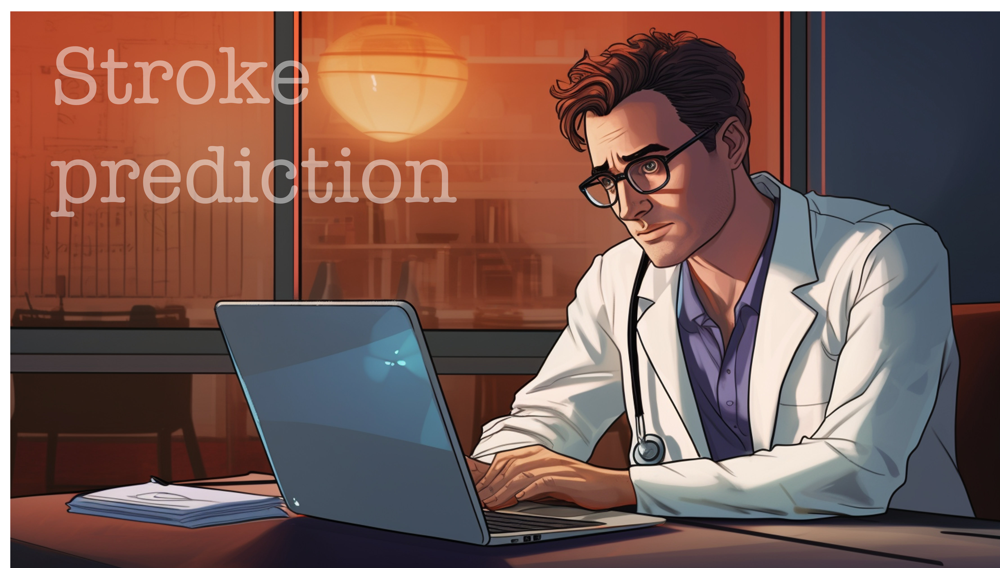

# Background

This project is dedicated to the analysis of *Stroke prediction dataset* from kaggle.com, machine learning model training, and model deployment:

- The Stroke prediction dataset consists of 11 clinical features of patients and the data about whether the stroke event has occurred. For clarity, a stroke is an event of the blocking of the blood flow to the brain or a sudden bleeding in the brain.

- The dataset is cleaned and analyzed to get insights about the health and demographics of the patients.

- Machine learning models are trained to predict weather a patient is likely or not to have a stroke based on various features.

- Machine learning model is deployed as a local server app, accessible via browser interface (more technical details in README.md file).

The dataset is accessible at kaggle.com/datasets/fedesoriano/stroke-prediction-dataset and is licensed to be used for educational purposes only.

*This notebook and the prediction ML model is providing should not be used on real patients.*

# Packages and configuration

In [1]:
# Numerical and data manipulation
import numpy as np
import pandas as pd
import random

# Graphical
import seaborn as sns
import matplotlib.pyplot as plt

# Statistics
from scipy import stats
from scipy.stats import mannwhitneyu
import statsmodels.api as sm

# Custom functions
from custom_functions import unique_values

# Model deployment
import joblib

# Warning handling
import warnings

# Feature analysis
import shap

from sklearn.linear_model import LogisticRegression
import xgboost as xgb

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline

from sklearn.metrics import (
    precision_recall_curve,
    auc,
    recall_score,
    accuracy_score,
    f1_score,
    average_precision_score,
    roc_curve,
    roc_auc_score,
    classification_report,
    confusion_matrix,
)

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [2]:
# Beautify the code with nb_black package to adhere to PEP8 requirements
%load_ext nb_black

# Increase the sharpness of graphical elements
%config InlineBackend.figure_format = 'svg'

<IPython.core.display.Javascript object>

# Data preparation

In [3]:
df = pd.read_csv(
    "/Users/drkazimieras/Turing College/Stroke prediction/healthcare-dataset-stroke-data.csv"
)

<IPython.core.display.Javascript object>

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


<IPython.core.display.Javascript object>

12 features in total, only 1 of them (bmi) has some missing values, three distinct data types:
- int64
- float64
- object

In [5]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


<IPython.core.display.Javascript object>

In [6]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


<IPython.core.display.Javascript object>

- 'id' is likely unnecessary value, thus it will be dropped.
- 'Age' was thought to be integer value in reality from the head of the data frame. However, it seems the fractions of years of age are included (e.g. min value is 0.08). For convenience, age will be later rounded to integer values.
- 'avg_glucose_level' - the usual notation of glucose levels in Europe is millimoles per liter (mmol/L) with typical levels between 4 to 5.6 mmol/L. However, in the US notation is milligrams per deciliter (mg/dL) with normal values ranging between 70 to 100 mg/dL (difference by around a factor of 18, wikipedia.org/wiki/Blood_sugar_level). Thus, this is likely the US notation having the units of mg/dL. Units will be included in the feature name.


In [7]:
# Remove one column that has no useful info (0=rows, 1=columns)
df = df.drop(["id"], axis=1)

<IPython.core.display.Javascript object>

In [8]:
unique_values(
    df,
    "gender",
    "hypertension",
    "heart_disease",
    "ever_married",
    "work_type",
    "Residence_type",
    "smoking_status",
    "stroke",
)

Feature >gender< unique values: ['Male' 'Female' 'Other']
Feature >hypertension< unique values: [0 1]
Feature >heart_disease< unique values: [1 0]
Feature >ever_married< unique values: ['Yes' 'No']
Feature >work_type< unique values: ['Private' 'Self-employed' 'Govt_job' 'children' 'Never_worked']
Feature >Residence_type< unique values: ['Urban' 'Rural']
Feature >smoking_status< unique values: ['formerly smoked' 'never smoked' 'smokes' 'Unknown']
Feature >stroke< unique values: [1 0]


<IPython.core.display.Javascript object>

To prepare for ML model training it is better to have as much as possible numerical values, thus binary Yes/No answers will be remapped, ordinal/nominal encoding of categorical features will not be done at this point. Also, some other adjustments to make the text cleaner will be done.

In [9]:
# Convert values of these columns
columns_for_conversion = ["ever_married", "work_type", "smoking_status", "stroke"]

# Use this dictionarry for conversion
columns_replace_map = {
    "Yes": 1,
    "No": 0,
    "Govt_job": "Government employee",
    "children": "Child",
    "Never_worked": "Never worked",
    "formerly smoked": "Formerly smoked",
    "never smoked": "Never smoked",
    "smokes": "Currently smoking",
}

# Do the conversion
for column in columns_for_conversion:
    df[column] = df[column].replace(columns_replace_map)

<IPython.core.display.Javascript object>

In [10]:
unique_values(
    df,
    "gender",
    "hypertension",
    "heart_disease",
    "ever_married",
    "work_type",
    "Residence_type",
    "smoking_status",
    "stroke",
)

Feature >gender< unique values: ['Male' 'Female' 'Other']
Feature >hypertension< unique values: [0 1]
Feature >heart_disease< unique values: [1 0]
Feature >ever_married< unique values: [1 0]
Feature >work_type< unique values: ['Private' 'Self-employed' 'Government employee' 'Child' 'Never worked']
Feature >Residence_type< unique values: ['Urban' 'Rural']
Feature >smoking_status< unique values: ['Formerly smoked' 'Never smoked' 'Currently smoking' 'Unknown']
Feature >stroke< unique values: [1 0]


<IPython.core.display.Javascript object>

In [11]:
# Filter dataframe to get min/max ages
min_age = df[df["work_type"] == "Never worked"]["age"].min()
max_age = df[df["work_type"] == "Child"]["age"].max()

print(f'Minimum age for a patient to be assigned status "Never worked": {min_age}')
print(f'Maximum age for a patient to be assigned status "Child": {max_age}')

Minimum age for a patient to be assigned status "Never worked": 13.0
Maximum age for a patient to be assigned status "Child": 16.0


<IPython.core.display.Javascript object>

Patients in the dataset are assigned as Child up to 16 y.o. However, "The Convention on the Rights of the Child is an international treaty that recognizes the human rights of children, defined as persons up to the age of 18 years." (unicef.org)

If someone is say 14 years old, they should not be assigned 'Never worked' as it is logical to assign Never worked status only to adults. However, data shows a 13 y.o. patient to have a work status as 'Never worked'. This should be corrected by accounting that some people <18 y.o. can already be working, but if not, they should retain status 'Child'.

In [12]:
# Change status to "Child' for patients aged <18 and having status 'Never worked'
df.loc[(df["age"] < 18) & (df["work_type"] == "Never worked"), "work_type"] = "Child"

<IPython.core.display.Javascript object>

In [13]:
# Filter dataframe to get min/max ages
min_age = df[df["work_type"] == "Never worked"]["age"].min()
max_age = df[df["work_type"] == "Child"]["age"].max()

print(f'New minimum age for a patient to be assigned status "Never worked": {min_age}')
print(f'New maximum age for a patient to be assigned status "Child": {max_age}')

New minimum age for a patient to be assigned status "Never worked": 18.0
New maximum age for a patient to be assigned status "Child": 17.0


<IPython.core.display.Javascript object>

In [14]:
# Calculate the occurrence of each unique value of 'status' for rows where 'bmi' is NaN
value_counts = df[df["bmi"].isna()]["stroke"].value_counts()

print(value_counts)

# Calculate the occurrence of each unique value of 'status' for rows where 'bmi' is NaN
value_counts = df["stroke"].value_counts()

print(value_counts)

stroke
0    161
1     40
Name: count, dtype: int64
stroke
0    4861
1     249
Name: count, dtype: int64


<IPython.core.display.Javascript object>

In [15]:
print(4000 / 161)

24.84472049689441


<IPython.core.display.Javascript object>

Around 25% of patients, who had stroke also have missing value of BMI. Thus, it may be incorrect to fill the missing values with an overall average BMI.

In [16]:
# Calculate mean BMI for each stroke status
mean_bmi_by_stroke_status = df.groupby("stroke")["bmi"].mean()

print(mean_bmi_by_stroke_status)

stroke
0    28.823064
1    30.471292
Name: bmi, dtype: float64


<IPython.core.display.Javascript object>

Indeed, there seems to be a difference of mean values forr these two groups of patients. Statistical inference may be a good way to check this assumption. But is the data normally distributed for parametric test?

Group (positive stroke) is not likely normally distributed!
Group (negative stroke) is not likely normally distributed!


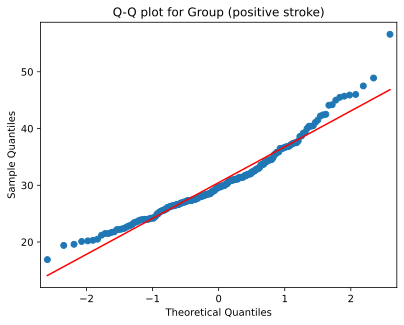

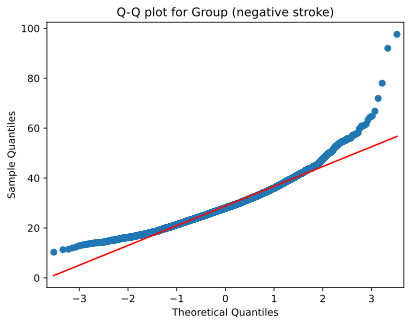

Variances are not equal across both groups!


<IPython.core.display.Javascript object>

In [17]:
# Shapiro-Wilk test from the scipy.stats

# Split the dataframe into two groups based on stroke status
# aand remove NaN values from the 'bmi' column before splitting
group_pos = df[df["stroke"] == 1]["bmi"].dropna()
group_neg = df[df["stroke"] == 0]["bmi"].dropna()

# Check normality for groups as p-value
# ignore test statistics (_,), no need
_, p1 = stats.shapiro(group_pos)
_, p2 = stats.shapiro(group_neg)

if p1 > 0.05:
    print("Group (positive stroke) is likely normally distributed.")
else:
    print("Group (positive stroke) is not likely normally distributed!")

if p2 > 0.05:
    print("Group (negative stroke) is likely normally distributed.")
else:
    print("Group (negative stroke) is not likely normally distributed!")

# Plot Q-Q to check weather datapoints lie on straigth line
sm.qqplot(group_pos, line="s")
plt.title("Q-Q plot for Group (positive stroke)")
plt.show()

sm.qqplot(group_neg, line="s")
plt.title("Q-Q plot for Group (negative stroke)")
plt.show()

# Check for variances (Levene’s test), weather from normal distributions?
_, p = stats.levene(group_pos, group_neg)
if p > 0.05:
    print("Variances are equal across both groups.")
else:
    print("Variances are not equal across both groups!")

Seems that BMI data is not normally distributed for patients who had and who didn't have a stroke, thus a non-parametric test (for statistical inference) will be used.

**Data cleaning question.**

Is it necessary to split patients into two groups to fill in missing data? If null hypothesis (*There is no statistically significant difference in median BMI between the two groups.*) is correct, then no; otherwise - yes!

In [18]:
# Split the dataframe into two groups based on stroke status
# and remove NaN values from the 'bmi' column before splitting
group_1 = df[df["stroke"] == 1]["bmi"].dropna()
group_2 = df[df["stroke"] == 0]["bmi"].dropna()

# Perform Mann-Whitney U test, because data in both groups are not normally distributed
# 'two-sided' to not check for the dirrection of difference in these groups
stat, p_value = mannwhitneyu(group_1, group_2, alternative="two-sided")
print(f"Mann-Whitney U statistic value: {stat}")
print(f"p-value: {p_value}")

# Set standart p-value level, and return the correct statement.
alpha = 0.05
if p_value < alpha:
    print(
        "Reject H0. There is a statistically significant difference in median BMI between the two groups."
    )
else:
    print(
        "There is no statistically significant difference in median BMI between the two groups."
    )

Mann-Whitney U statistic value: 569021.5
p-value: 0.00010264290844688746
Reject H0. There is a statistically significant difference in median BMI between the two groups.


<IPython.core.display.Javascript object>

Indeed, there is the difference (not taking into account how big is the difference.). Thus, it will be accounted for when filling the missing values.

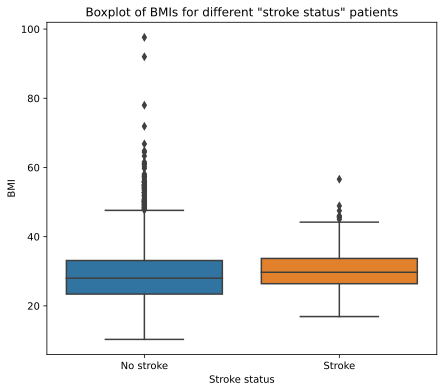

<IPython.core.display.Javascript object>

In [19]:
df_out = df.dropna(subset=["bmi"])

# Boxplot to check for outliers
plt.figure(figsize=(7, 6))
sns.boxplot(x="stroke", y="bmi", data=df_out)
plt.title('Boxplot of BMIs for different "stroke status" patients')
plt.xlabel("Stroke status")
plt.ylabel("BMI")
plt.xticks(ticks=[0, 1], labels=["No stroke", "Stroke"])
plt.show()

There may be at least 4 significant outliers in "No Stroke" group.

In [20]:
outlier_BMI = df[df["bmi"] > 70]
outlier_BMI

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
544,Male,42.0,0,0,1,Private,Rural,210.48,71.9,Never smoked,0
928,Female,23.0,1,0,0,Private,Urban,70.03,78.0,Currently smoking,0
2128,Male,17.0,1,0,0,Private,Rural,61.67,97.6,Unknown,0
4209,Male,38.0,1,0,1,Private,Rural,56.90,92.0,Never smoked,0


<IPython.core.display.Javascript object>

In [21]:
# Index of rows where BMI is likely outliers, and drop them
drop_index = df[df["bmi"] >= 70].index
df.drop(drop_index, inplace=True)

<IPython.core.display.Javascript object>

In [22]:
# Calculate mean (median) BMI for each stroke status group
median_bmi_by_stroke_status = df.groupby("stroke")["bmi"].median()

print(median_bmi_by_stroke_status)

stroke
0    28.0
1    29.7
Name: bmi, dtype: float64


<IPython.core.display.Javascript object>

In [23]:
median_group_pos = df[df["stroke"] == 1]["bmi"].median()
median_group_negat = df[df["stroke"] == 0]["bmi"].median()

# Fill NaN with medians for those wo had and didin't have a stroke
df.loc[(df["stroke"] == 1) & (df["bmi"].isna()), "bmi"] = median_group_pos
df.loc[(df["stroke"] == 0) & (df["bmi"].isna()), "bmi"] = median_group_negat

<IPython.core.display.Javascript object>

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5106 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             5106 non-null   object 
 1   age                5106 non-null   float64
 2   hypertension       5106 non-null   int64  
 3   heart_disease      5106 non-null   int64  
 4   ever_married       5106 non-null   int64  
 5   work_type          5106 non-null   object 
 6   Residence_type     5106 non-null   object 
 7   avg_glucose_level  5106 non-null   float64
 8   bmi                5106 non-null   float64
 9   smoking_status     5106 non-null   object 
 10  stroke             5106 non-null   int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 478.7+ KB


<IPython.core.display.Javascript object>

In [25]:
# Recalculate glucose level to European standart and round
df["avg_glucose_level"] = df["avg_glucose_level"] / 18.018
df["avg_glucose_level"] = df["avg_glucose_level"].round(1)

<IPython.core.display.Javascript object>

In [26]:
# Rename columns for convenience (inplace=True, so original df is modified, default is False)
df.rename(
    columns={
        "gender": "Gender",
        "age": "Age",
        "hypertension": "Hypertension",
        "heart_disease": "Heart disease",
        "ever_married": "Ever married",
        "work_type": "Work type",
        "Residence_type": "Residence type",
        "avg_glucose_level": "Avg. glucose (mg/dL)",
        "bmi": "BMI",
        "smoking_status": "Smoking status",
        "stroke": "Stroke",
    },
    inplace=True,
)

<IPython.core.display.Javascript object>

In [27]:
df.head()

,Gender,Age,Hypertension,Heart disease,Ever married,Work type,Residence type,Avg. glucose (mg/dL),BMI,Smoking status,Stroke
0,Male,67.0,0,1,1,Private,Urban,12.7,36.6,Formerly smoked,1
1,Female,61.0,0,0,1,Self-employed,Rural,11.2,29.7,Never smoked,1
2,Male,80.0,0,1,1,Private,Rural,5.9,32.5,Never smoked,1
3,Female,49.0,0,0,1,Private,Urban,9.5,34.4,Currently smoking,1
4,Female,79.0,1,0,1,Self-employed,Rural,9.7,24.0,Never smoked,1


<IPython.core.display.Javascript object>

Although some age values are in fractions, it will be easier for ML model deployment to have just integer values of age. 

In [28]:
# Make ages integers
df["Age"] = df["Age"].apply(lambda x: int(round(x)))

<IPython.core.display.Javascript object>

Reduce amount of categorical data by modifying on more feature.

In [29]:
# Replace 'Urban' with 1 and 'Rural' with 0
df["Residence type"].replace({"Urban": 1, "Rural": 0}, inplace=True)

df.rename(columns={"Residence type": "From urban area"}, inplace=True)

<IPython.core.display.Javascript object>

In [30]:
df.head()

,Gender,Age,Hypertension,Heart disease,Ever married,Work type,From urban area,Avg. glucose (mg/dL),BMI,Smoking status,Stroke
0,Male,67,0,1,1,Private,1,12.7,36.6,Formerly smoked,1
1,Female,61,0,0,1,Self-employed,0,11.2,29.7,Never smoked,1
2,Male,80,0,1,1,Private,0,5.9,32.5,Never smoked,1
3,Female,49,0,0,1,Private,1,9.5,34.4,Currently smoking,1
4,Female,79,1,0,1,Self-employed,0,9.7,24.0,Never smoked,1


<IPython.core.display.Javascript object>

In [31]:
df.tail()

,Gender,Age,Hypertension,Heart disease,Ever married,Work type,From urban area,Avg. glucose (mg/dL),BMI,Smoking status,Stroke
5105,Female,80,1,0,1,Private,1,4.6,28.0,Never smoked,0
5106,Female,81,0,0,1,Self-employed,1,6.9,40.0,Never smoked,0
5107,Female,35,0,0,1,Self-employed,0,4.6,30.6,Never smoked,0
5108,Male,51,0,0,1,Private,0,9.2,25.6,Formerly smoked,0
5109,Female,44,0,0,1,Government employee,1,4.7,26.2,Unknown,0


<IPython.core.display.Javascript object>

Suggestion for additional feature creation:
1. It could be important just to know if someone has above/below normal glucose levels;

Data for these can be found to be "glucose_too_high = 5.6" and "glucose_too_low = 3.9"
(from who.int/data/gho/indicator-metadata-registry/imr-details/2380).

2. It could be important just to know if someone has above/below normal BMI.

<...>

# Exploratory data analysis

In [32]:
stroke_counts = df["Stroke"].value_counts()
print(stroke_counts)

Stroke
0    4857
1     249
Name: count, dtype: int64


<IPython.core.display.Javascript object>

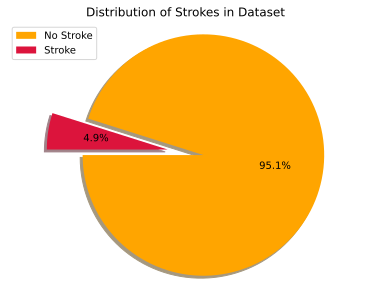

<IPython.core.display.Javascript object>

In [33]:
labels = "No Stroke", "Stroke"
sizes = df["Stroke"].value_counts()
colors = ["orange", "crimson"]
# Highlith small fraction
explode = (0.3, 0)

# Plot
plt.pie(
    sizes,
    explode=explode,
    colors=colors,
    autopct="%1.1f%%",
    shadow=True,
    startangle=180,
)
plt.legend(labels, loc="best")
# Draw as circle
plt.axis("equal")
plt.title("Distribution of Strokes in Dataset")
plt.show()

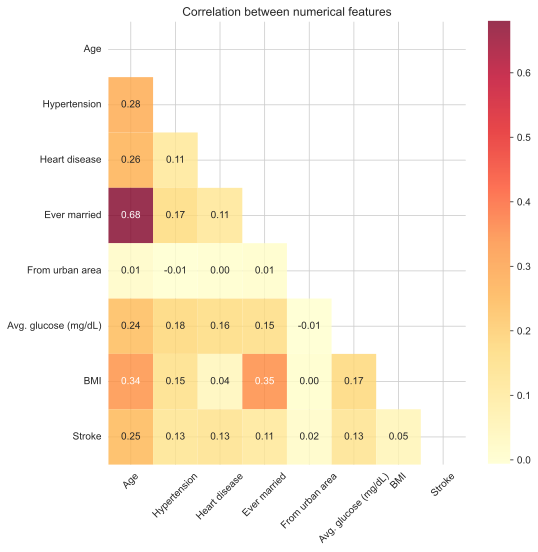

<IPython.core.display.Javascript object>

In [34]:
sns.set_style('whitegrid')

# Calculate Pearson correlation for numeric features ONLY
correlation_matrix = df.corr(numeric_only=True)

# Mask
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="YlOrRd", mask=mask, alpha=0.8)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.title("Correlation between numerical features")
plt.show()


Most obvious correlation is the one between people aging and creating a family. Among all numerical features stroke shows considerable correlation with age only. Age also seems to be slightly correlated with increased BMI, having heart problems such as disease and hypertension.

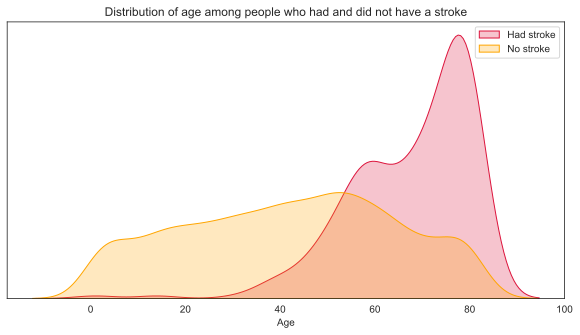

<IPython.core.display.Javascript object>

In [35]:
sns.set_style("white")

plt.figure(figsize=(10, 5))
sns.kdeplot(
    df[df["Stroke"] == 1]["Age"],
    color="crimson",
    thresh=0.05,
    fill=True,
    label="Had stroke",
)
sns.kdeplot(df[df["Stroke"] == 0]["Age"], color="orange", fill=True, label="No stroke")
plt.title("Distribution of age among people who had and did not have a stroke")
plt.xlabel("Age")
plt.ylabel("")

# Hide y-axis (no useful info as density)
plt.yticks([])

# Could be used to start x axis from 0, but does not look good..
# ax.set_xlim(left=0)

plt.legend()
plt.show()

Likelihood of stroke clearly increases with age, also two waves of stroke patients appear at around 60 and around 80 years of age.

ChatGPT was consulted on the pattern, it suggests:
- **Survivor Effect:** Individuals who are at a higher risk for stroke might have already experienced their first stroke before the age of 65. Consequently, the group of individuals who reach age 65 without having had a stroke might be somewhat "selected" for lower stroke risk.
- **Retirement and Lifestyle Changes:** Around the age of 65, many individuals in several countries retire. This can lead to a change in daily routines, reduced stress, better sleep, and sometimes more attention to health and leisure. These positive lifestyle changes could lead to a transient decrease in stroke risk.
- **Healthcare Interventions:** It's also possible that, around the age of 65, individuals have more frequent medical check-ups or begin to receive age-specific health screenings. This could lead to better management of risk factors such as hypertension, diabetes, and high cholesterol, all of which play a significant role in stroke risk.
- **Medication Adherence:** Around retirement age, there might be better adherence to prescribed medications due to a more stable daily routine, or possibly due to eligibility for certain health benefits or prescription assistance programs that start at this age in some countries.
- **Eligibility for Benefits:** In countries with certain healthcare structures, turning 65 might mean becoming eligible for senior-specific health programs or benefits. This might lead to improved healthcare access and preventive services for this age group.

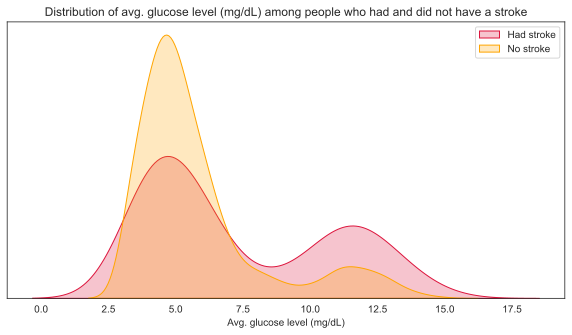

<IPython.core.display.Javascript object>

In [36]:
plt.figure(figsize=(10, 5))
sns.kdeplot(
    df[df["Stroke"] == 1]["Avg. glucose (mg/dL)"],
    color="crimson",
    thresh=0.05,
    fill=True,
    label="Had stroke",
)
sns.kdeplot(
    df[df["Stroke"] == 0]["Avg. glucose (mg/dL)"],
    color="orange",
    fill=True,
    label="No stroke",
)
plt.title(
    "Distribution of avg. glucose level (mg/dL) among people who had and did not have a stroke"
)
plt.xlabel("Avg. glucose level (mg/dL)")
plt.ylabel("")

plt.yticks([])
# ax = plt.gca()

plt.legend()
plt.show()

Among those who had stroke were more people with diabetes, Avg. glucose level (mg/dL). However, one should be aware about the fact when the measurements were taken. Maybe after a stroke the glucose level increases? **Medical community should be consulted on that.**

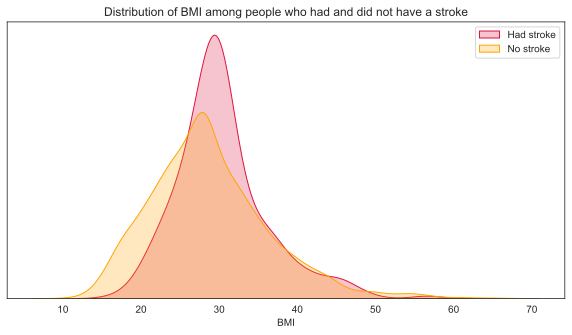

<IPython.core.display.Javascript object>

In [37]:
plt.figure(figsize=(10, 5))
sns.kdeplot(
    df[df["Stroke"] == 1]["BMI"],
    color="crimson",
    thresh=0.05,
    fill=True,
    label="Had stroke",
)
sns.kdeplot(df[df["Stroke"] == 0]["BMI"], color="orange", fill=True, label="No stroke")
plt.title("Distribution of BMI among people who had and did not have a stroke")
plt.xlabel("BMI")
plt.ylabel("")

plt.yticks([])

plt.legend()
plt.show()

BMI results were in-depth analysed in the data cleaning part.

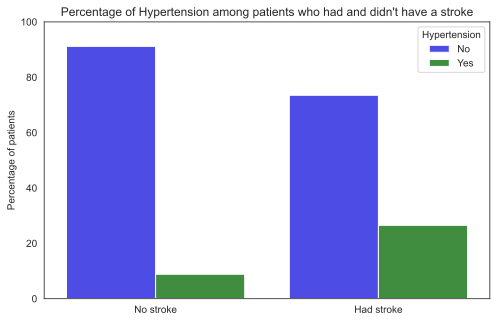

<IPython.core.display.Javascript object>

In [38]:
feature = "Hypertension"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New labels with clear names
df_percentage[feature] = df_percentage[feature].map({0: "No", 1: "Yes"})
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Plotting
plt.figure(figsize=(8, 5))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=["blue", "green"],
    alpha=0.8,  # mute colors a bit
)
plt.ylim(0, 100)
plt.title(f"Percentage of {feature} among patients who had and didn't have a stroke")
plt.ylabel("Percentage of patients")
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

Seems that hypertension was more prevalent in patients who had stroke. However, it should be clarified if high blood pressure was observed long before the stroke, or just after it.

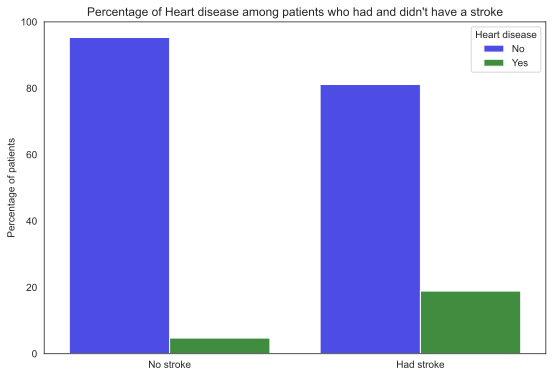

<IPython.core.display.Javascript object>

In [39]:
feature = "Heart disease"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New labels with clear names
df_percentage[feature] = df_percentage[feature].map({0: "No", 1: "Yes"})
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Plotting
plt.figure(figsize=(9, 6))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=["blue", "green"],
    alpha=0.8,
)
plt.ylim(0, 100)
plt.title(f"Percentage of {feature} among patients who had and didn't have a stroke")
plt.ylabel("Percentage of patients")
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

Heart diseases are more common in patients having a stroke. The exact reason is unknown, as heart disease can become more common as person ages, and age is also correlated with the probability of having a stroke.

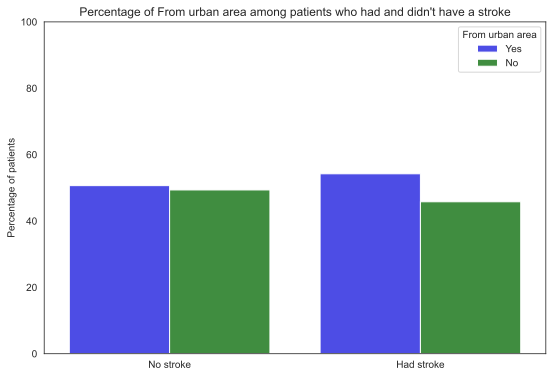

<IPython.core.display.Javascript object>

In [40]:
feature = "From urban area"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New labels with clear names
df_percentage[feature] = df_percentage[feature].map({0: "No", 1: "Yes"})
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Plotting
plt.figure(figsize=(9, 6))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=["blue", "green"],
    alpha=0.8,
)
plt.ylim(0, 100)
plt.title(f"Percentage of {feature} among patients who had and didn't have a stroke")
plt.ylabel("Percentage of patients")
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

Urban environment has little impact on the Stroke. However, it is existing.

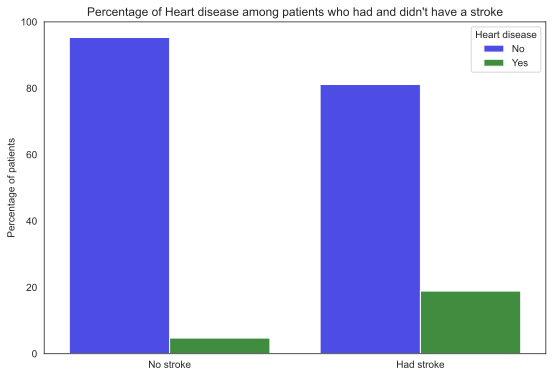

<IPython.core.display.Javascript object>

In [41]:
feature = "Heart disease"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New labels with clear names
df_percentage[feature] = df_percentage[feature].map({0: "No", 1: "Yes"})
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Plotting
plt.figure(figsize=(9, 6))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=["blue", "green"],
    alpha=0.8,
)
plt.ylim(0, 100)
plt.title(f"Percentage of {feature} among patients who had and didn't have a stroke")
plt.ylabel("Percentage of patients")
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

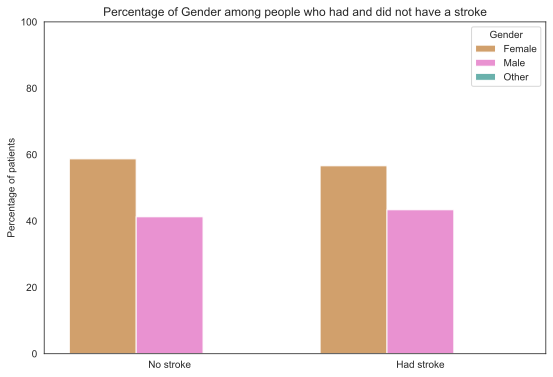

<IPython.core.display.Javascript object>

In [42]:
# Get a list of many colors
color_options = 30
all_colors = sns.color_palette("husl", color_options)

feature = "Gender"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New label for the 'Stroke" column
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Randomly select colors based on unique feature values
num_unique_values = df[feature].nunique()
selected_colors = random.sample(all_colors, num_unique_values)

# Plotting
plt.figure(figsize=(9, 6))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=selected_colors,
    alpha=0.8,
)
# Show all percent
plt.ylim(0, 100)

# Set and plot
plt.title(f"Percentage of {feature} among people who had and did not have a stroke")
plt.ylabel("Percentage of patients")
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

In [43]:
other_gender_patients = df[df["Gender"] == "Other"]
other_gender_patients

,Gender,Age,Hypertension,Heart disease,Ever married,Work type,From urban area,Avg. glucose (mg/dL),BMI,Smoking status,Stroke
3116,Other,26,0,0,0,Private,0,8.0,22.4,Formerly smoked,0


<IPython.core.display.Javascript object>

Females had more strokes than males. However, females were also more frequently appearing among all the patients in the dataset. This dataset also includes one non-binary person. this person was among those not having a stoke.

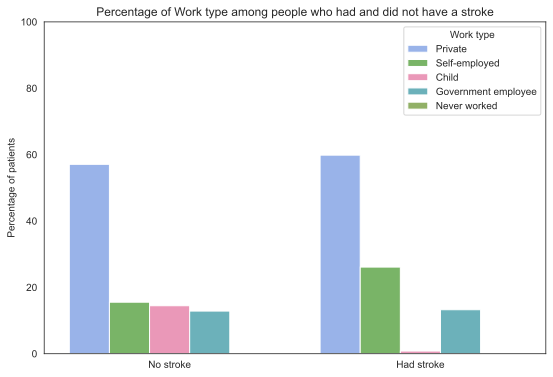

<IPython.core.display.Javascript object>

In [44]:
# Get a list of many colors, let's shuffle randomly for this part of analysis
color_options = 30
all_colors = sns.color_palette("husl", color_options)

feature = "Work type"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New label for the 'Stroke" column
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Randomly select colors based on unique feature values
num_unique_values = df[feature].nunique()
selected_colors = random.sample(all_colors, num_unique_values)

# Plotting
plt.figure(figsize=(9, 6))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=selected_colors,
    alpha=0.8,
)
# Show all percent
plt.ylim(0, 100)

# Set and plot
plt.title(f"Percentage of {feature} among people who had and did not have a stroke")
plt.ylabel("Percentage of patients")
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

In [45]:
child_stroke_patients = df[(df["Work type"] == "Child") & (df["Stroke"] == 1)]
child_stroke_patients

,Gender,Age,Hypertension,Heart disease,Ever married,Work type,From urban area,Avg. glucose (mg/dL),BMI,Smoking status,Stroke
162,Female,1,0,0,0,Child,1,3.9,29.7,Unknown,1
245,Female,14,0,0,0,Child,0,3.2,30.9,Unknown,1


<IPython.core.display.Javascript object>

It's unclear if work type could have an impact on person having a stroke. It is clear that most patients overall were working in private companies. Two children had a stroke, this can be considered as an outlier case.

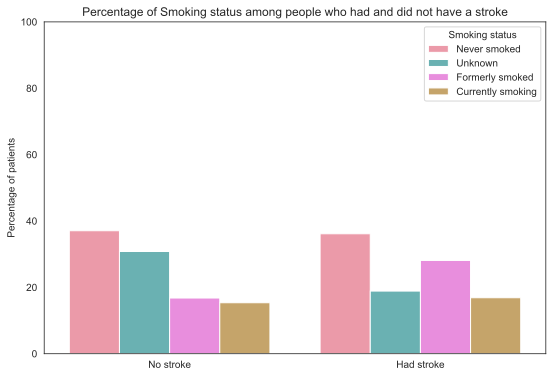

<IPython.core.display.Javascript object>

In [46]:
# Get a list of many colors
color_options = 30
all_colors = sns.color_palette("husl", color_options)

feature = "Smoking status"

# Efficient calculation of percentage
df_percentage = (
    df.groupby("Stroke")[feature]
    .value_counts(normalize=True)
    .mul(100)
    .reset_index(name="Percentage")
)

# New label for the 'Stroke" column
df_percentage["Stroke"] = df_percentage["Stroke"].map({0: "No stroke", 1: "Had stroke"})

# Randomly select colors based on unique feature values
num_unique_values = df[feature].nunique()
selected_colors = random.sample(all_colors, num_unique_values)

# Plotting
plt.figure(figsize=(9, 6))
sns.barplot(
    x="Stroke",
    y="Percentage",
    hue=feature,
    data=df_percentage,
    palette=selected_colors,
    alpha=0.8,
)
# Show all percent
plt.ylim(0, 100)

# Set and plot
plt.title(f"Percentage of {feature} among people who had and did not have a stroke")
plt.ylabel("Percentage of patients")
# No label
plt.xlabel("")
plt.legend(title=feature, loc="upper right")
plt.show()

Surprisingly, history of smoking had relatively mild impact on stroke condition. With highest number of patients experiencing a stroke having never smoked.

In [47]:
# Check if original data remained intact after analysis
df.head()

,Gender,Age,Hypertension,Heart disease,Ever married,Work type,From urban area,Avg. glucose (mg/dL),BMI,Smoking status,Stroke
0,Male,67,0,1,1,Private,1,12.7,36.6,Formerly smoked,1
1,Female,61,0,0,1,Self-employed,0,11.2,29.7,Never smoked,1
2,Male,80,0,1,1,Private,0,5.9,32.5,Never smoked,1
3,Female,49,0,0,1,Private,1,9.5,34.4,Currently smoking,1
4,Female,79,1,0,1,Self-employed,0,9.7,24.0,Never smoked,1


<IPython.core.display.Javascript object>

# Machine learning

## Logistic regression

This model can be used for modeling the probability of binary features, instead of continuous variable as in linear regression. It is also a popular choice in medical diagnosis, as far as I know.

In [48]:
# Labels/targets (x) and features/predictors (y) from dataset
X = df.drop("Stroke", axis=1)
y = df["Stroke"]

# Split training and prediction data, stratify makes sure proportion of 1 and 0 is consisten
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=93, stratify=y
)

<IPython.core.display.Javascript object>

In [49]:
cat_features = [feat_name for feat_name in X.columns if X[feat_name].dtype == "object"]
cat_features

['Gender', 'Work type', 'Smoking status']

<IPython.core.display.Javascript object>

In [50]:
num_features = [
    feat_name
    for feat_name in X.columns
    if X[feat_name].dtype == "int64" or X[feat_name].dtype == "float64"
]
num_features

['Age',
 'Hypertension',
 'Heart disease',
 'Ever married',
 'From urban area',
 'Avg. glucose (mg/dL)',
 'BMI']

<IPython.core.display.Javascript object>

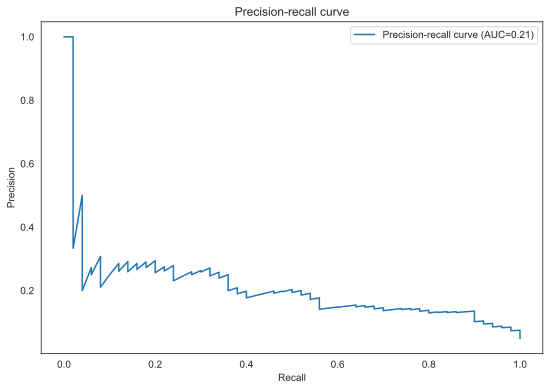

Accuracy: 0.74
Recall: 0.80
Precision: 0.05
F1 Score: 0.23


<IPython.core.display.Javascript object>

In [51]:
# Preprocessing for numeric and categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_features),
        ("cat", OneHotEncoder(drop="first"), cat_features),
    ],
    remainder="passthrough",
)

# Model with Synthetic Minority Over-sampling Technique (SMOTE) to handle imbalance
model = imbpipeline(
    [
        ("preprocessor", preprocessor),
        ("smote", SMOTE(random_state=93)),
        ("classifier", LogisticRegression(random_state=93)),
    ]
)

# Train and predict
model.fit(X_train, y_train)
y_proba = model.predict_proba(X_test)[:, 1]

# precision, and recall, and thresholds, and prec-rec curve
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)
pr_auc = auc(recall, precision)

# plot prec-rec curve
plt.figure(figsize=(9, 6))
plt.plot(recall, precision, label=f"Precision-recall curve (AUC={pr_auc:.2f})")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-recall curve")
plt.legend(loc="best")
plt.show()

# check for metric - recall and others
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

recall_score = recall_score(y_test, y_pred)
print(f"Recall: {recall_score:.2f}")

print(f"Precision: {precision[0]:.2f}")

f1 = f1_score(y_test, y_pred)
print(f"F1 Score: {f1:.2f}")

The most important metric for this model seems to be recall, so that we can classify true positive cases as good as possible. However, this is achieved at an expense of precision. A lot of patients who don't have a stroke may be classified as having one. This is also not a good observation, as healthcare system may become overwhelmed by too many false positive cases. Good balance would be to find the optimal threshold. Healthcare system workers could suggest that. However, this time we can use another technique as a threshold use closest p-r curve point to optimal models point (1;1), as in this example: analyticsindiamag.com/complete-guide-to-understanding-precision-and-recall-curves/.

In [52]:
distances_to_ideal = np.sqrt((1 - recall[:-1]) ** 2 + (1 - precision[:-1]) ** 2)

optimal_threshold = thresholds[np.argmin(distances_to_ideal)]
print(f"Optimal threshold suggested: {optimal_threshold}")

Optimal threshold suggested: 0.4333156934935412


<IPython.core.display.Javascript object>

In [53]:
y_proba = model.predict_proba(X_test)[:, 1]
y_pred_optimal = (y_proba > optimal_threshold).astype(int)

<IPython.core.display.Javascript object>

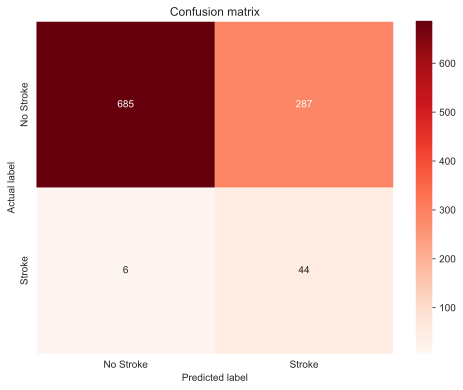

<IPython.core.display.Javascript object>

In [54]:
# confusion matrix to help understand model predictions
cm = confusion_matrix(y_test, y_pred_optimal)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=["No Stroke", "Stroke"],
    yticklabels=["No Stroke", "Stroke"],
)
plt.ylabel("Actual label")
plt.xlabel("Predicted label")
plt.title("Confusion matrix")
plt.show()

Model seems to be classifying most of Stroke cases correctly, with updated threshold value.

In [55]:
# Save model for later deployment, if it will prove to be the best
# New threshold to improve performance exported as well
deploy_model = {"model": model, "threshold": optimal_threshold}

<IPython.core.display.Javascript object>

## XGBoost

eXtreme Gradient Boosting technique is a model that combines predictions of multiple decision trees by adjusting weights of misclassified data points after building each tree.

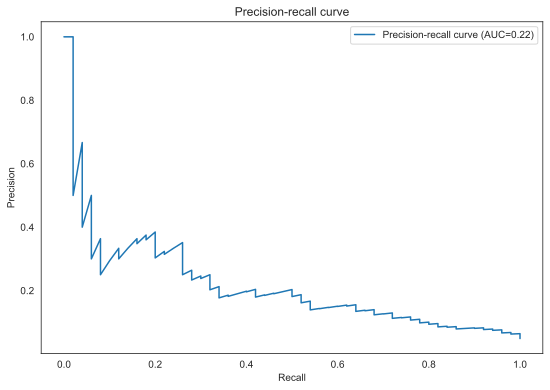

Report for XGBoost model:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       972
           1       0.26      0.26      0.26        50

    accuracy                           0.93      1022
   macro avg       0.61      0.61      0.61      1022
weighted avg       0.93      0.93      0.93      1022



<IPython.core.display.Javascript object>

In [56]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_features),
        ("cat", OneHotEncoder(drop="first", handle_unknown="ignore"), cat_features),
    ]
)

pipeline = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "classifier",
            xgb.XGBClassifier(
                eval_metric="logloss",
                scale_pos_weight=(len(y) - sum(y))
                / sum(y),  # Will use scaling, not SMOTE
                random_state=42,
            ),
        ),
    ]
)

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)
y_scores_xgb = pipeline.predict_proba(X_test)[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, y_scores_xgb)
pr_auc = auc(recall, precision)

plt.figure(figsize=(9, 6))
plt.plot(
    recall,
    precision,
    label=f"Precision-recall curve (AUC={average_precision_score(y_test, y_scores_xgb):.2f})",
)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-recall curve")
plt.legend(loc="best")
plt.show()

print("Report for XGBoost model:")
print(classification_report(y_test, y_pred))

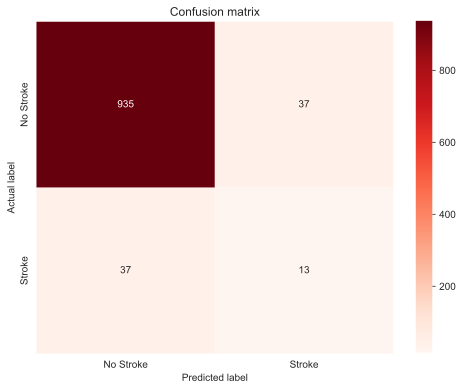

<IPython.core.display.Javascript object>

In [57]:
# confusion matrix to help understand model predictions
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=["No Stroke", "Stroke"],
    yticklabels=["No Stroke", "Stroke"],
)
plt.ylabel("Actual label")
plt.xlabel("Predicted label")
plt.title("Confusion matrix")
plt.show()

Model seems to be classifying majority of stroke patients incorrectly, which is a concerning observation. Again, optimization parameters should be decided by the medical professionals. Thus, XGBoost model will be not used in deployment this time.

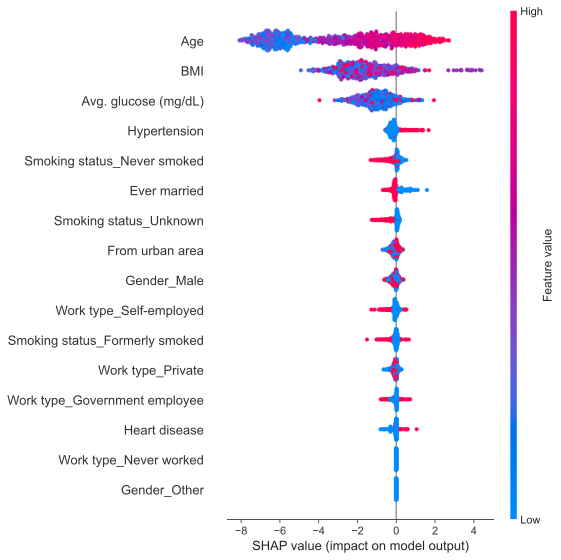

<IPython.core.display.Javascript object>

In [58]:
## SHapley Additive exPlanations

preprocessor = pipeline.named_steps["preprocessor"]
xgb_model = pipeline.named_steps["classifier"]
X_test_preprocessed = preprocessor.transform(X_test)

# transformed feature names for one-hot encoded features
ohe_categories = preprocessor.named_transformers_["cat"].get_feature_names_out(
    cat_features
)
feature_names_transformed = num_features + ohe_categories.tolist()

# Create explainer, claculate SHAP value and plot
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test_preprocessed)
# Minor warning silence
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap.summary_plot(
        shap_values, X_test_preprocessed, feature_names=feature_names_transformed
    )

Dots for *Age* red and to the right, meaning higher age values increase the likelihood of stroke. And,
dots blue and to the left - lower age values in this case significantly decrease decrease the likelihood of stroke.
*Age*, *BMI*, and *average glucose level* seems to be the features that the model pays most attention to.

In [59]:
joblib.dump(deploy_model, "prediction_model.joblib")

['prediction_model.joblib']

<IPython.core.display.Javascript object>

# Main results and conclusions

The outcome of this work is twofold - it has medical insights and personal learning results.
**Main medical insight:** People are more likely to have a stroke when they age, have elevated BMI and average glucose level.
**Main learning results:** The analysis helped me strengthen my data analysis and ML model training skills when working with heavily imbalanced datasets. Also, it was the first time I was deploying the created model. Please, give it a try!